# 인물모드 사진 만들기(아웃포커싱)

## Step1. 인물모드 직접해보기
### 1. 사진준비하기

In [1]:
import os
import urllib
import cv2
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt

(3024, 4032, 3)


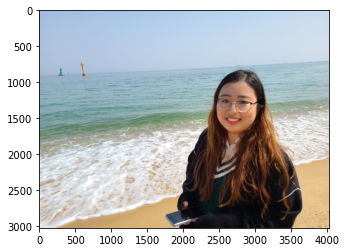

In [46]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/selfie1.jpg'
img_orig = cv2.imread(img_path)

print(img_orig.shape)

# cv가 이미지를 BGR 순서대로 읽기 때문에 RGB로 바꿔주기
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

## 세그멘테이션으로 사람 분리하기

In [47]:
# 모델 가져오기
model_dir = os.getenv('HOME') + '/aiffel/human_segmentation/models'
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 

model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [48]:
# 가져온 모델을 통해 이미지 분할하기
segvalues, output = model.segmentAsPascalvoc(img_path)

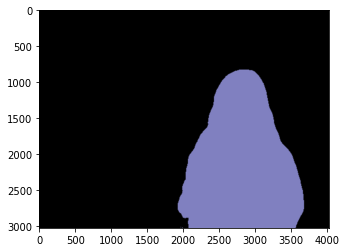

In [49]:
plt.imshow(output)
plt.show()

In [50]:
#pascalvoc 데이터의 라벨종류
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

In [51]:
segvalues

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [52]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


In [53]:
# 컬러맵 만들기
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20] 

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [54]:
person_colormap = colormap[15]
person_colormap

array([192, 128, 128])

In [55]:
# person_colormap은 RGB 순서인데, output 배열은 BRG 순서로 배치되어 있기때문예
# 컬러맵 색상 순서 변경해주기
seg_color = (128, 128, 192)

(3024, 4032)


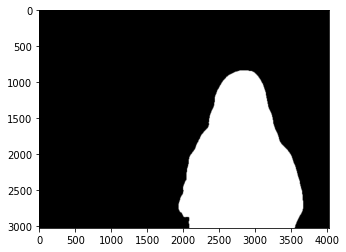

In [56]:
# output에서 seg_color와 같은 값을 가지는 위치를 True로 설정
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
# cmap='gray' 0이면 검정, 1이면 흰색
plt.imshow(seg_map,cmap='gray')
plt.show()

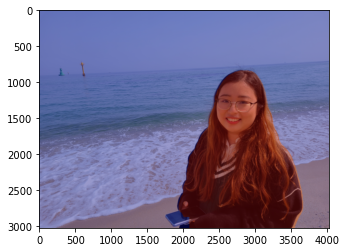

In [57]:
img_show = img_orig.copy()

img_mask = seg_map.astype(np.uint8) * 255

color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

### 배경 흐리게 하기

(3024, 4032, 3) (3024, 4032, 3)


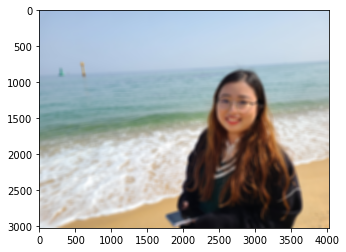

In [58]:
img_orig_blur = cv2.blur(img_orig, (50, 50))
print(img_orig_blur.shape, img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

In [59]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
print(img_mask.shape, img_mask_color.shape)

(3024, 4032) (3024, 4032, 3)


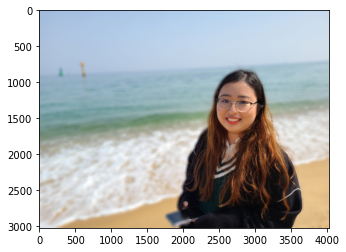

In [60]:
img_concat = np.where(img_mask_color==255, img_orig, img_orig_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

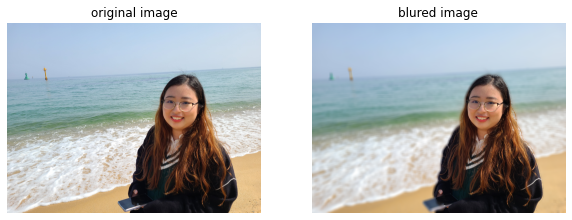

In [61]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.title('original image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.title('blured image')
plt.axis('off')

plt.show()

### 여러 이미지로 시도하기

In [18]:
def person_shallow_focus(img_path, blur):
    # 이미지 가져와서 분리하기
    img_orig = cv2.imread(img_path)
    segvalues, output = model.segmentAsPascalvoc(img_path)
    
    # 분리 결과 person 픽셀에 255 값을 가지는 mask 만들기
    seg_map = np.all(output==seg_color, axis=-1)
    img_mask = seg_map.astype(np.uint8) * 255
    img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
    
    # 배경 흐리게 하기
    img_orig_blur = cv2.blur(img_orig, (blur, blur))
    
    # 흐리게한 배경과 인물 합치기
    img_concat = np.where(img_mask_color==255, img_orig, img_orig_blur)
    
    # 전후 비교해서 보여주기
    plt.figure(figsize=(20, 10))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
    plt.title('original image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
    plt.title('blured image')
    plt.axis('off')

    plt.show()

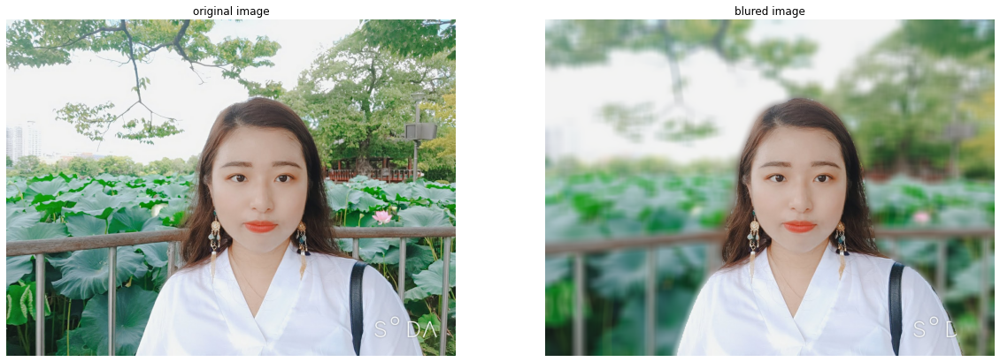

In [19]:
sec_img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/selfie2.jpg'
person_shallow_focus(sec_img_path, 30)

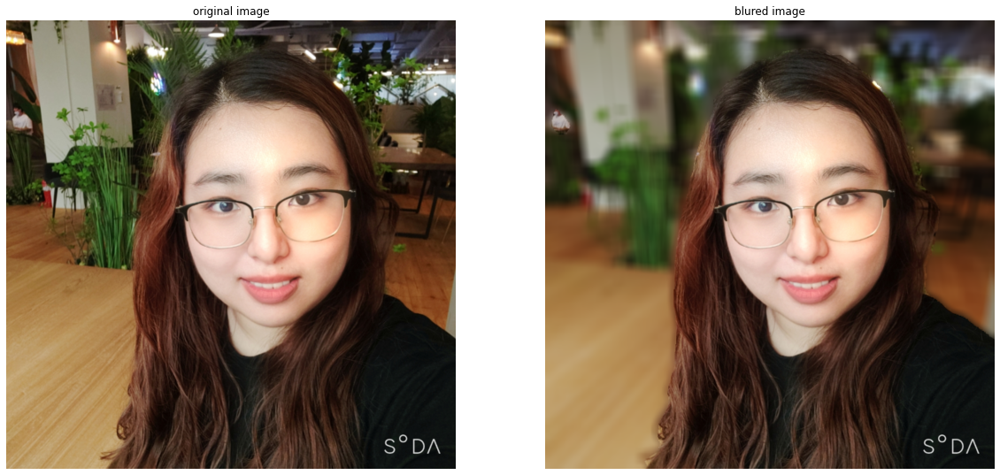

In [20]:
img_path3 = os.getenv('HOME')+'/aiffel/human_segmentation/images/selfie3.jpg'
person_shallow_focus(img_path3, 30)

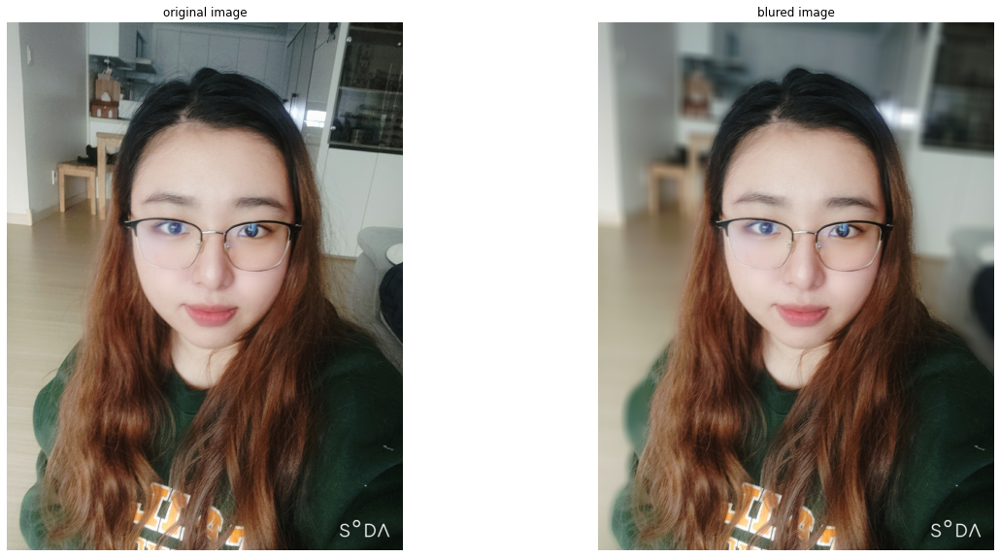

In [21]:
img_path4 = os.getenv('HOME')+'/aiffel/human_segmentation/images/selfie4.jpg'
person_shallow_focus(img_path4, 30)

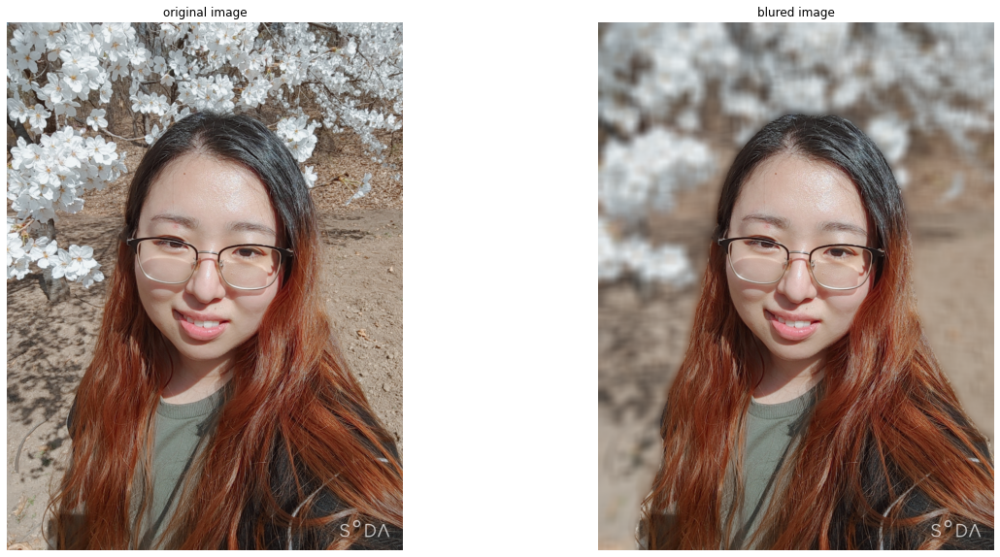

In [22]:
img_path5 = os.getenv('HOME')+'/aiffel/human_segmentation/images/selfie5.jpg'
person_shallow_focus(img_path5, 30)

### 사람 말고 다른 오브젝트로 시도하기

In [23]:
def shallow_focus(img_path, object_name, blur):
    # 이미지 가져와서 분리하기
    img_orig = cv2.imread(img_path)
    print(img_orig.shape)
    segvalues, output = model.segmentAsPascalvoc(img_path)
    
    # 분리하고자 하는 object가 LABEL_NAMES와 분리된 class에 있는지 확인하기
    if object_name in LABEL_NAMES:
        colormap_idx = LABEL_NAMES.index(object_name)
        if colormap_idx in segvalues['class_ids']:
            object_colormap = colormap[colormap_idx]
            R, G, B = object_colormap
            seg_color = (B, G, R)
            print(object_colormap)
            print(seg_color)
            
            # 분리 결과 person 픽셀에 255 값을 가지는 mask 만들기
            seg_map = np.all(output==seg_color, axis=-1)
            print(seg_map.shape)            
            
            img_mask = seg_map.astype(np.uint8) * 255
            img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
            print(img_mask.shape)
            print(img_mask_color.shape)

            # 배경 흐리게 하기
            img_orig_blur = cv2.blur(img_orig, (blur, blur))

            # 흐리게한 배경과 인물 합치기
            img_concat = np.where(img_mask_color==255, img_orig, img_orig_blur)

            # 전후 비교해서 보여주기
            plt.figure(figsize=(20, 10))

            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
            plt.title('original image')
            plt.axis('off')

            plt.subplot(1, 2, 2)
            plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
            plt.title('blured image')
            plt.axis('off')

            plt.show()
            
        else:
            print("{} is not in image".format(object_name))
    
    else: 
        print("Model can't segment {}".format(object_name))
    

(1667, 2516, 3)
[64  0  0]
(0, 0, 64)
(1667, 2516)
(1667, 2516)
(1667, 2516, 3)


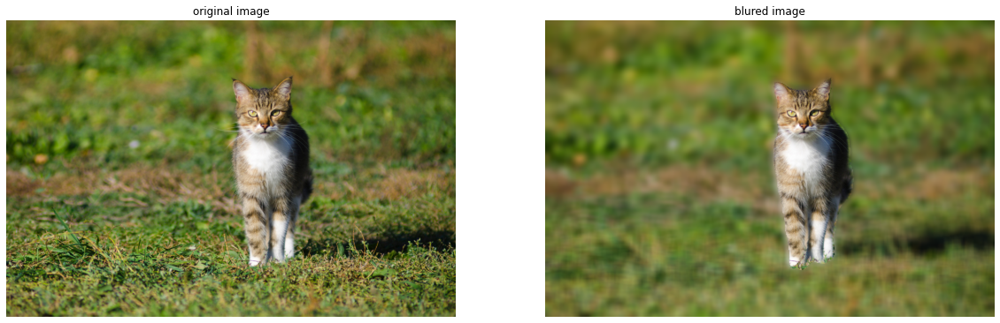

In [24]:
img_path0 = os.getenv('HOME')+'/aiffel/human_segmentation/images/cat0.jpg'
shallow_focus(img_path0, 'cat', 50)

(1440, 1080, 3)
[ 64   0 128]
(128, 0, 64)
(1440, 1080)
(1440, 1080)
(1440, 1080, 3)


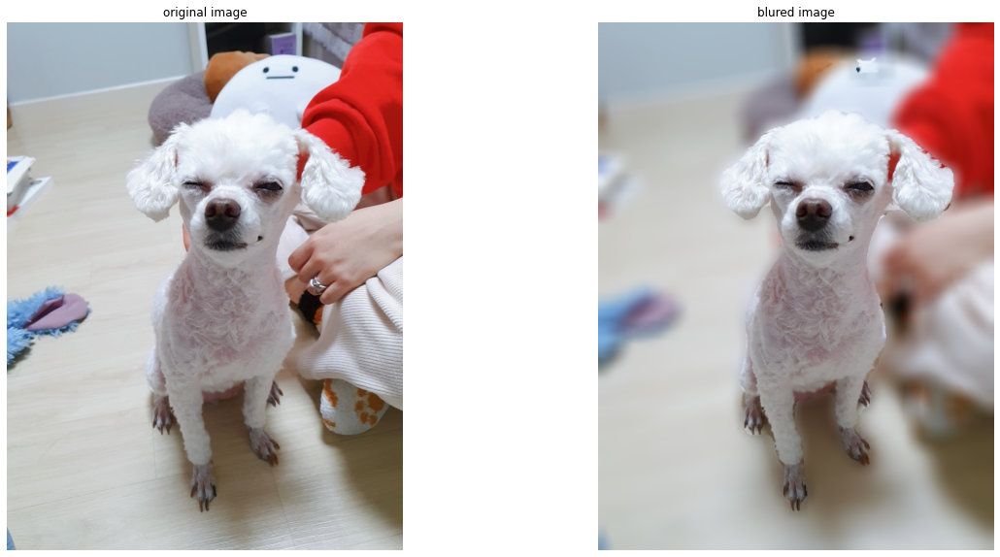

In [25]:
img_path11 = os.getenv('HOME')+'/aiffel/human_segmentation/images/dog1.jpg'
shallow_focus(img_path11, 'dog', 50)

(1440, 1080, 3)
[192 128 128]
(128, 128, 192)
(1440, 1080)
(1440, 1080)
(1440, 1080, 3)


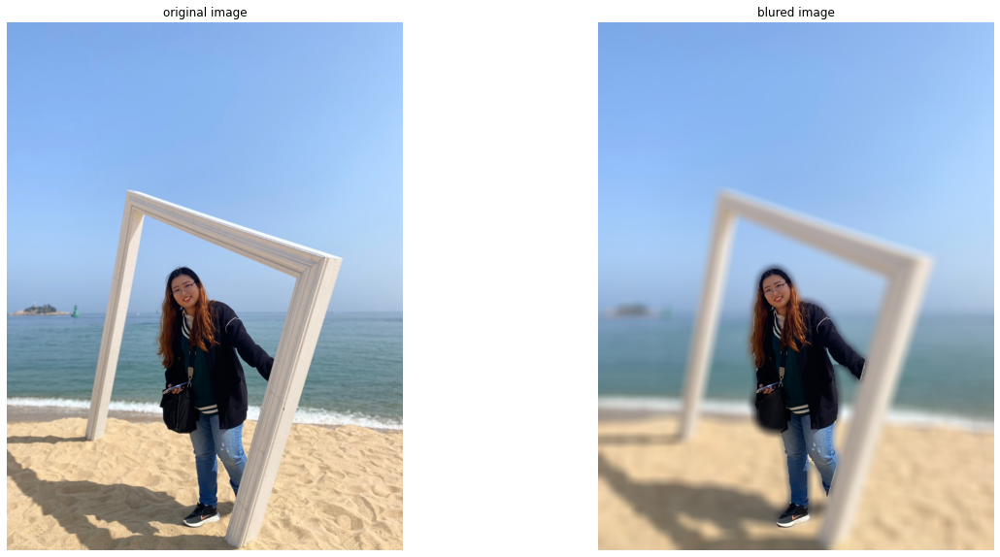

In [26]:
img_path13 = os.getenv('HOME')+'/aiffel/human_segmentation/images/whole.jpg'
shallow_focus(img_path13, 'person', 30)

사람이나 강아지는 제대로 인식했는데,
고양이만 seg_map을 만드는데 문제가 있었음 -> 단순 전치 행렬했을 때 좌우 반전된 그림이 나오는 듯? 어디서 문제가 발생했는지 알아봐야 함

(1328, 1920, 3)
[ 64 128   0]
(0, 128, 64)
(1328, 1920)
(1328, 1920)
(1328, 1920, 3)


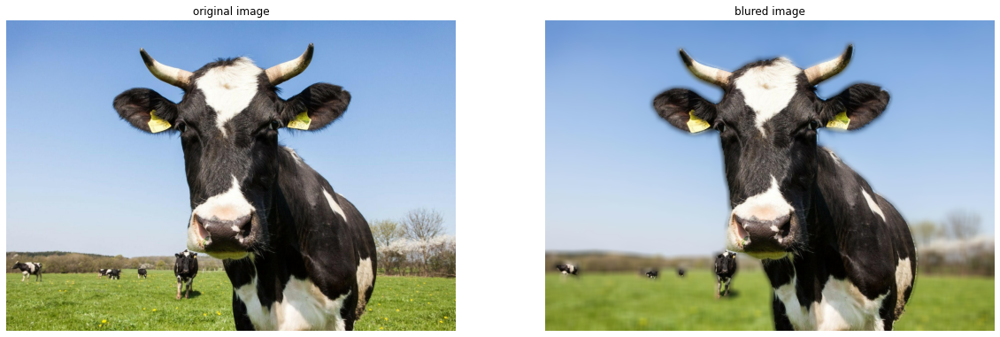

In [27]:
cow_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/cow.jpg'
shallow_focus(cow_path, 'cow', 30)

(4000, 2250, 3)
[ 0 64  0]
(0, 64, 0)
(4000, 2250)
(4000, 2250)
(4000, 2250, 3)


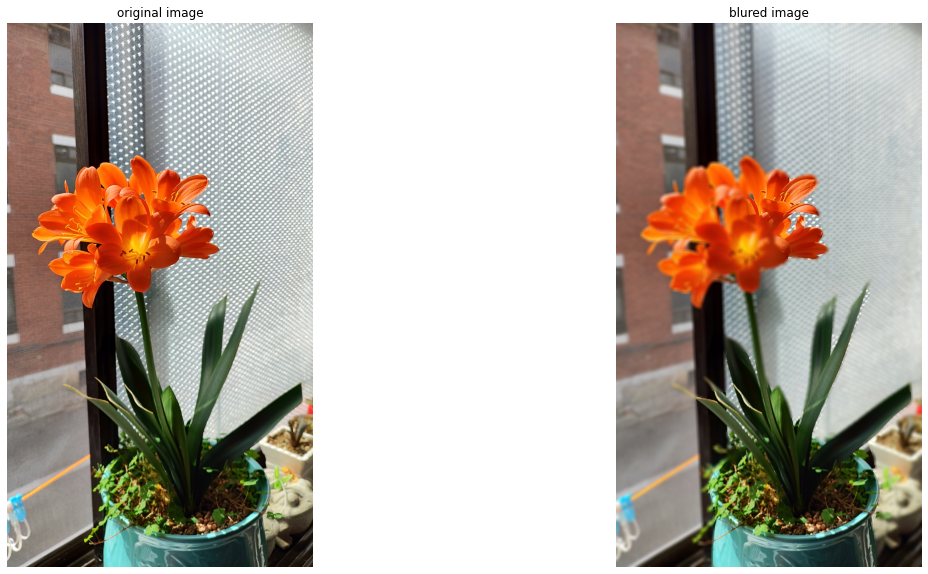

In [28]:
plant_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/plant.jpg'
shallow_focus(plant_path, 'pottedplant', 30)

### 다른 배경 적용하기

우주 이미지 출처: <a href="https://kr.freepik.com/free-photo/ultra-detailed-nebula-abstract-wallpaper-4_39994508.htm#query=%EC%9A%B0%EC%A3%BC&position=0&from_view=keyword&track=sph">작가 Vaynakh</a> 출처 Freepik

(3333, 5000, 3)


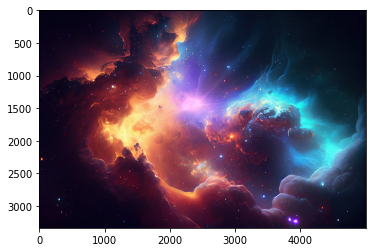

In [29]:
bg_img_path =  os.getenv('HOME')+'/aiffel/human_segmentation/images/ultra-detailed-nebula-abstract-wallpaper-4.jpg'
bg_orig = cv2.imread(bg_img_path)

print(bg_orig.shape)

plt.imshow(cv2.cvtColor(bg_orig, cv2.COLOR_BGR2RGB))
plt.show()

(3024, 4032, 3)


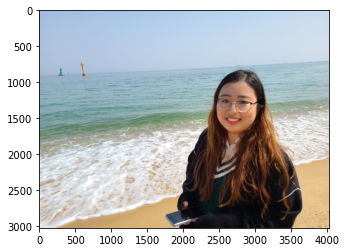

In [30]:
img_orig = cv2.imread(img_path)

print(img_orig.shape)

plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

(3024, 4032, 3)


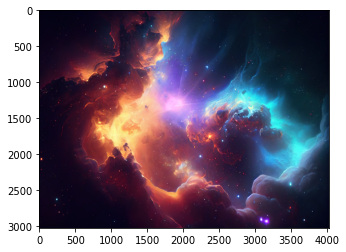

In [31]:
resize_bg = cv2.resize(bg_orig, (4032, 3024))
print(resize_bg.shape)
plt.imshow(cv2.cvtColor(resize_bg, cv2.COLOR_BGR2RGB))
plt.show()

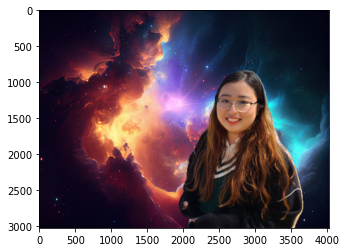

In [32]:
img_concat2 = np.where(img_mask_color==255, img_orig, resize_bg)
plt.imshow(cv2.cvtColor(img_concat2, cv2.COLOR_BGR2RGB))
plt.show()

In [33]:
def person_background_change(img_path, bg_path):
    # 이미지 가져오기
    img_orig = cv2.imread(img_path)
    bg_orig = cv2.imread(bg_path)
    
    # 배경사진 크기를 img_orig 크기에 맞추기
    resize_bg = cv2.resize(bg_orig, (img_orig.shape[1], img_orig.shape[0]))
    
    # 이미지 segmentation 진행하기
    segvalues, output = model.segmentAsPascalvoc(img_path)
    
    # 분리 결과 person 픽셀에 255 값을 가지는 mask 만들기
    seg_map = np.all(output==seg_color, axis=-1)
    img_mask = seg_map.astype(np.uint8) * 255
    img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
    
    
    # 흐리게한 배경과 인물 합치기
    img_concat = np.where(img_mask_color==255, img_orig, resize_bg)
    
    # 전후 비교해서 보여주기
    plt.figure(figsize=(20, 10))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
    plt.title('original image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
    plt.title('changed image')
    plt.axis('off')

    plt.show()

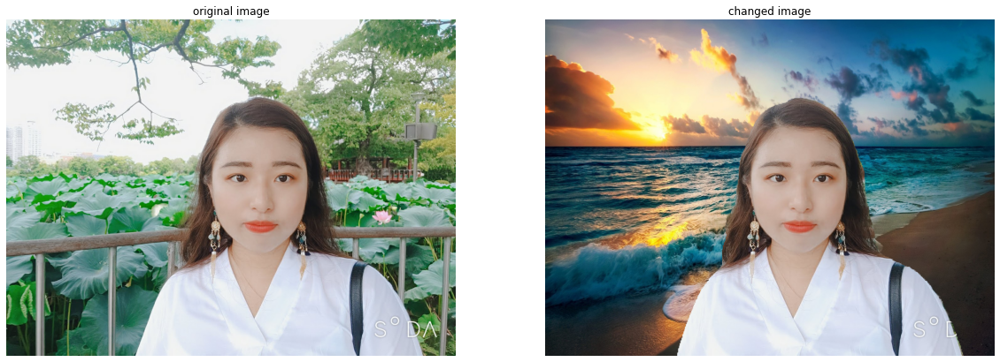

In [34]:
bg_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/beach.jpg'
person_background_change(sec_img_path, bg_path)

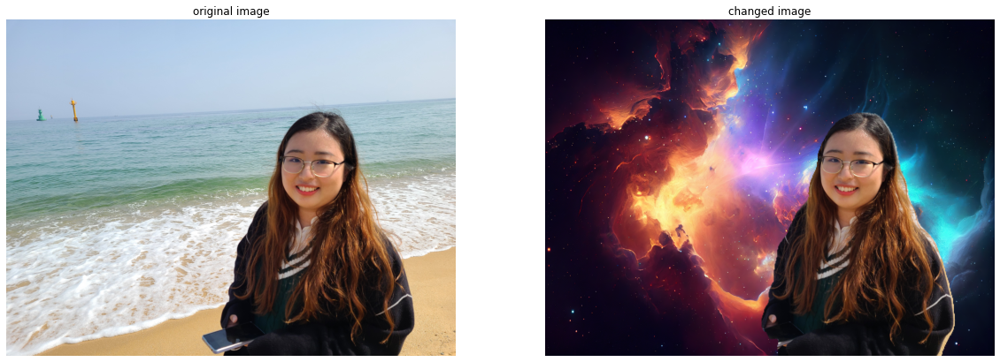

In [35]:
person_background_change(img_path, bg_img_path)

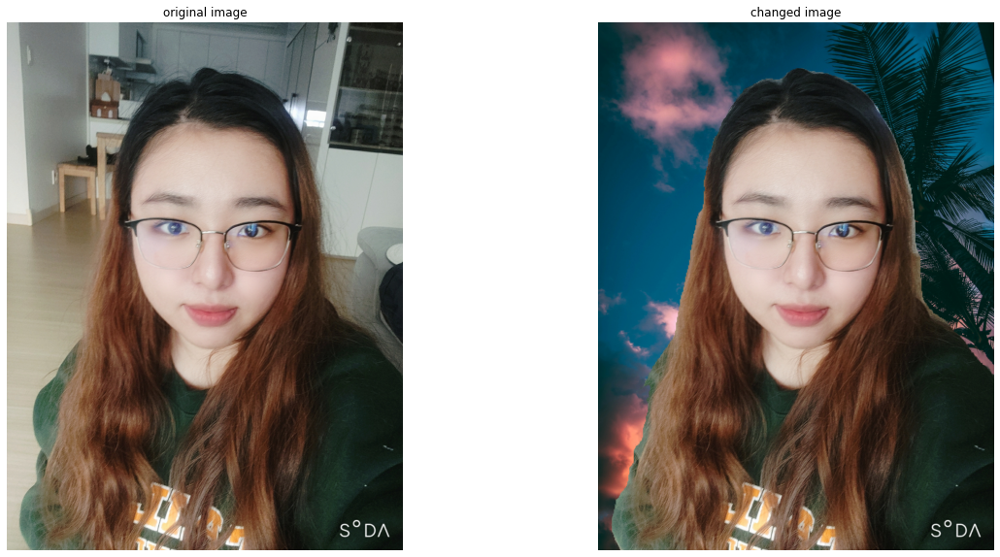

In [36]:
img_path4
bg_path2 = os.getenv('HOME')+'/aiffel/human_segmentation/images/background.jpg'
person_background_change(img_path4, bg_path2)

(1829, 1509, 3)
[192 128 128]
(128, 128, 192)
(1829, 1509)
(1829, 1509)
(1829, 1509, 3)


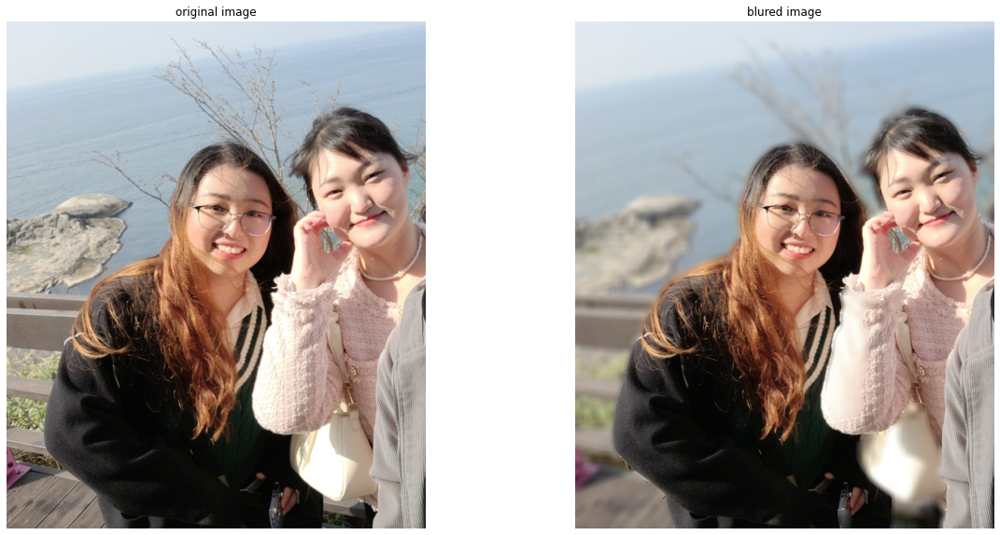

In [37]:
img_path5 = os.getenv('HOME')+'/aiffel/human_segmentation/images/people2.jpg'
shallow_focus(img_path5, 'person', 30)

## Step 2. 사진에서 문제점 찾기

In [88]:
img_orig_cow = cv2.imread(cow_path)
segvalues, output = model.segmentAsPascalvoc(cow_path)

seg_color = (0, 128, 64)
# 분리 결과 person 픽셀에 255 값을 가지는 mask 만들기
seg_map = np.all(output==seg_color, axis=-1)
img_mask = seg_map.astype(np.uint8) * 255
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
    
# 배경 흐리게 하기
img_orig_blur_cow = cv2.blur(img_orig_cow, (30, 30))
    
# 흐리게한 배경과 인물 합치기
img_concat_cow = np.where(img_mask_color==255, img_orig_cow, img_orig_blur_cow)

<function matplotlib.pyplot.show(close=None, block=None)>

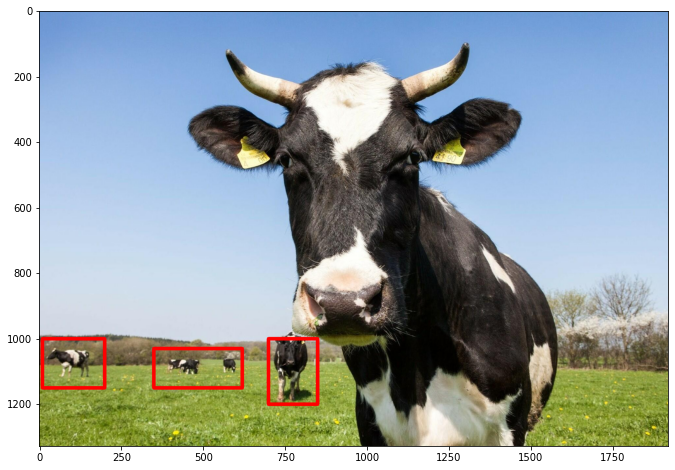

In [89]:
error_img_cow = img_orig_cow.copy()

plt.figure(figsize=(12, 8))
cv2.rectangle(error_img_cow, (700, 1000), (850, 1200), (0, 0, 255), 10)
cv2.rectangle(error_img_cow, (10, 1000), (200, 1150), (0, 0, 255), 10)
cv2.rectangle(error_img_cow, (350, 1030), (620, 1150), (0, 0, 255), 10)
plt.imshow(cv2.cvtColor(error_img_cow, cv2.COLOR_BGR2RGB))
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

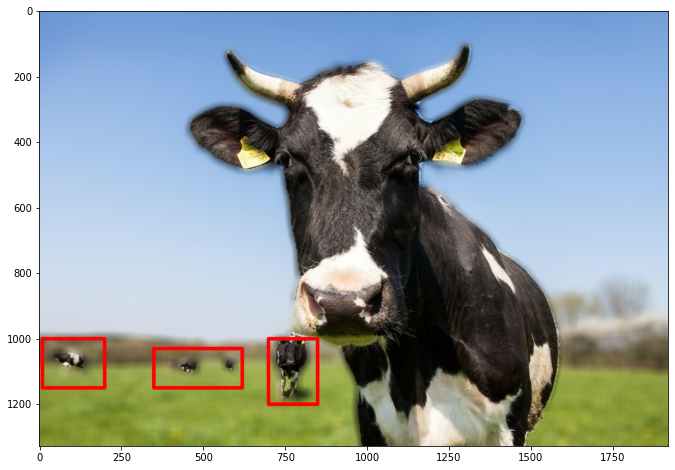

In [90]:
error_concat_cow = img_concat_cow.copy()

plt.figure(figsize=(12, 8))
cv2.rectangle(error_concat_cow, (700, 1000), (850, 1200), (0, 0, 255), 10)
cv2.rectangle(error_concat_cow, (10, 1000), (200, 1150), (0, 0, 255), 10)
cv2.rectangle(error_concat_cow, (350, 1030), (620, 1150), (0, 0, 255), 10)
plt.imshow(cv2.cvtColor(error_concat_cow, cv2.COLOR_BGR2RGB))
plt.show

소 이미지의 경우, 빨간 박스 안에 있는 소들은 같은 class의 소이지만, 실제로는 다른 심도에 위치하여 아웃포커싱할 시 블러처리 되었어야 할 객체들이다. 하지만 class 단위로 분류하는 sementic segmentation의 한계로 다른 심도에 있는 소들도 같이 mask에 걸리게 되었다.   
-> 개선하기 위해서는 객체 단위로 분류하는 instance segmentation이 필요해 보임

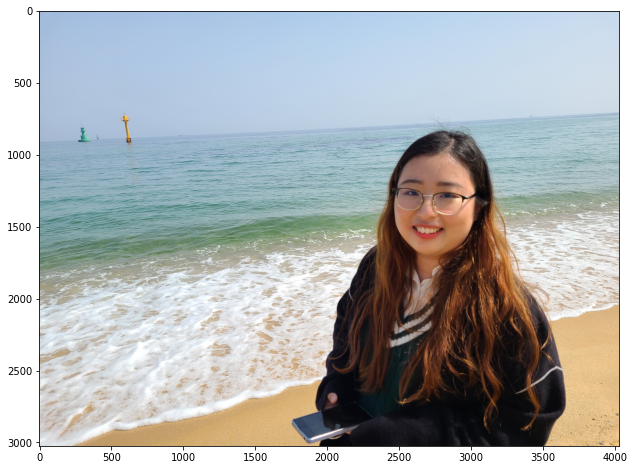

In [38]:
plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

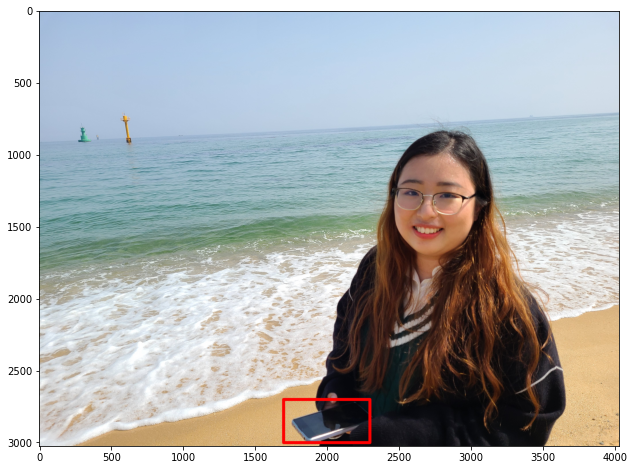

In [62]:
error_img_orig = img_orig.copy()

plt.figure(figsize=(12, 8))
cv2.rectangle(error_img_orig, (1700, 2700), (2300, 3000), (0, 0, 255), 20)
plt.imshow(cv2.cvtColor(error_img_orig, cv2.COLOR_BGR2RGB))
plt.show

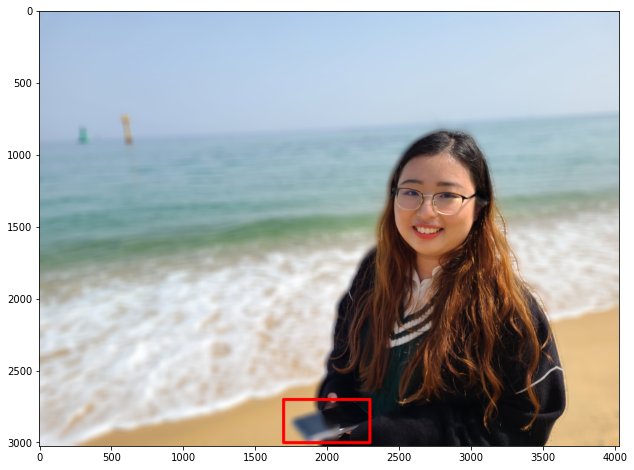

In [63]:
error_concat = img_concat.copy()

plt.figure(figsize=(12, 8))
cv2.rectangle(error_concat, (1700, 2700), (2300, 3000), (0, 0, 255), 20)
plt.imshow(cv2.cvtColor(error_concat, cv2.COLOR_BGR2RGB))
plt.show()

빨간 사각형 안에 있는 핸드폰은 인물과 같은 심도에 있기 때문에, 진짜 피사계심도를 이용한 아웃포커스 사진이라면 포커스가 같이 잡혀야 한다. 하지만 세그먼트를 통해 인물이 아니라고 구분된 부분을 모두 블러처리해버려서 인물과 같은 심도에 있더라도 사람으로 인식되지 않으면 블러처리되는 오류가 발생했다.

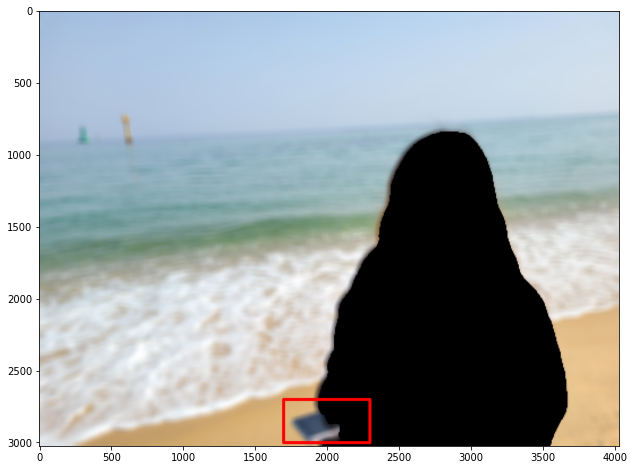

In [65]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)

plt.figure(figsize=(12, 8))
cv2.rectangle(img_bg_blur, (1700, 2700), (2300, 3000), (0, 0, 255), 20)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

블러처리된 배경에서 인물사진만 빼고 보면 휴대폰이 블러처리된 것을 더 명확하게 볼 수 있다

In [72]:
img_orig2 = cv2.imread(img_path5)
segvalues, output = model.segmentAsPascalvoc(img_path5)
    
# 분리 결과 person 픽셀에 255 값을 가지는 mask 만들기
seg_map = np.all(output==seg_color, axis=-1)
img_mask = seg_map.astype(np.uint8) * 255
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
    
# 배경 흐리게 하기
img_orig_blur2 = cv2.blur(img_orig2, (30, 30))
    
# 흐리게한 배경과 인물 합치기
img_concat2 = np.where(img_mask_color==255, img_orig2, img_orig_blur2)

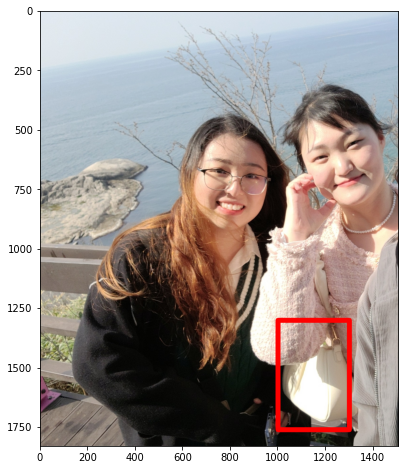

In [73]:
plt.figure(figsize=(12, 8))

error_img_orig2 = img_orig2.copy()

cv2.rectangle(error_img_orig2, (1000, 1300), (1300, 1760), (0, 0, 255), 20)
plt.imshow(cv2.cvtColor(error_img_orig2, cv2.COLOR_BGR2RGB))
plt.show()

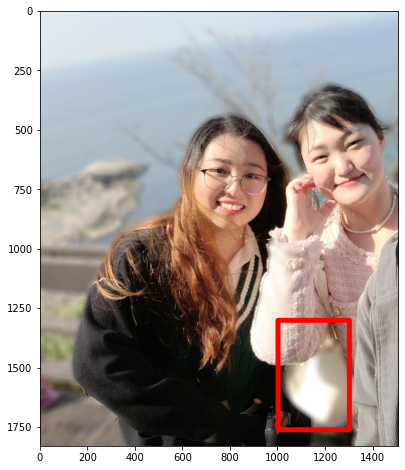

In [74]:
error_concat2 = img_concat2.copy()

plt.figure(figsize=(12, 8))
cv2.rectangle(error_concat2, (1000, 1300), (1300, 1760), (0, 0, 255), 20)
plt.imshow(cv2.cvtColor(error_concat2, cv2.COLOR_BGR2RGB))
plt.show()

이 사진도 마찬가지로 인물과 같은 심도(위치)에 있는 가방이 같이 블러처리 된 것을 알 수 있다.  
이렇게 같은 위치에 있는 다른 오브젝트가 블러처리되면서 결과물 사진이 부자연스러워 지는 것이 이와 같은 방식의 한계점으로 보인다.

## Step 3. 해결방법 제안해 보기

* 문제점: 진짜 심도를 이용한 방법이 아니어서 같은 심도에 있는 물체도 타겟이 아니라면 배경으로 취급되는 단점

* 보완 방법: 단일 이미지를 보고 심도를 파악하는 과정 추가
    * Monodepth2 활용
    * [Monodepth2 github](https://github.com/nianticlabs/monodepth2)
    * [Digging into Self-Supervised Monocular Depth Prediction](https://arxiv.org/abs/1806.01260)
    
* 순서도:
    1. 이미지를 불러와서 Instance segmentation 진행
    2. 똑같은 이미지에 대해 Monodepth를 통한 심도 예측 진행
    3. segmentation을 통해 구분된 대상들 중 초점을 맞출 대상의 위치정보를 가지고, Monodepth에서 해당 대상과 다른 픽셀들 간의 심도 차이 계산
    4. 심도 차이가 클수록 blur 강도를 크게 주는 방식으로 배경 이미지 보정
    5. 초점 맞출 대상을 보정한 배경 이미지와 합치기